<a href="https://colab.research.google.com/github/chrishg23-jpg/HES-benchmark/blob/main/HES16Sim005.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Parameters
L = 20
steps = 50
alpha = 0.6
beta  = 0.005
gamma = 0.0001

# 5D lattice and memory
s = np.clip(np.random.uniform(-1.0, 1.0, (L, L, L, L, L)), -1.0, 1.0)
curvature_memory = np.zeros_like(s)

# Seed asymmetry (two hypercubes)
s[4:9, 4:9, 4:9, 4:9, 4:9] += 0.4
s[11:15, 11:15, 11:15, 11:15, 11:15] -= 0.4

# 5D Laplacian
def laplacian_5d(a):
    lap = (
        np.roll(a, 1, axis=0) + np.roll(a, -1, axis=0) +
        np.roll(a, 1, axis=1) + np.roll(a, -1, axis=1) +
        np.roll(a, 1, axis=2) + np.roll(a, -1, axis=2) +
        np.roll(a, 1, axis=3) + np.roll(a, -1, axis=3) +
        np.roll(a, 1, axis=4) + np.roll(a, -1, axis=4) - 10 * a
    )
    return np.clip(lap, -100.0, 100.0)

# 5D gradient energy
def grad_energy_5d(a):
    return float(np.mean(np.sqrt(
        (np.roll(a, -1, 0) - a)**2 +
        (np.roll(a, -1, 1) - a)**2 +
        (np.roll(a, -1, 2) - a)**2 +
        (np.roll(a, -1, 3) - a)**2 +
        (np.roll(a, -1, 4) - a)**2
    )))

# Ring sampling on 2D plane
def sample_ring_2d(field2d, radius=8, n_points=64):
    h, w = field2d.shape
    c0, c1 = h//2, w//2
    theta = np.linspace(0, 2*np.pi, n_points, endpoint=False)
    return np.array([
        field2d[(c0 + int(round(radius*np.cos(t)))) % h,
                (c1 + int(round(radius*np.sin(t)))) % w]
        for t in theta
    ])

# Metrics storage
metrics = []

# Visualization setup (central 3D slice: fix axes 3 and 4 to center)
v0 = L // 2
w0 = L // 2
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlim(0, L); ax.set_ylim(0, L); ax.set_zlim(0, L)
ax.set_title("Curvature Memory in 5D HES lattice (central 3D slice)")

def update(frame):
    global s, curvature_memory
    lap = laplacian_5d(s)
    global_entropy = np.mean(s) * 0.995
    s += alpha * lap - beta * s - gamma * global_entropy
    s = np.clip(s, -5.0, 5.0)

    curvature_memory += np.abs(lap)

    # Store 5D metrics
    metrics.append({
        'step': frame,
        'entropy': np.var(s),
        'grad_energy': grad_energy_5d(s),
        'curvature_energy': float(np.mean(np.abs(lap))),
        # Emergence stability proxy (central 3D slice variance of lap)
        'slice_curv_var': float(np.var(lap[:, :, :, v0, w0]))
    })

    # Visualize top 5% memory on central 3D slice
    mem3d = curvature_memory[:, :, :, v0, w0]
    mem_thresh = np.percentile(mem3d, 95)
    x, y, z = np.where(mem3d > mem_thresh)
    intensity = mem3d[x, y, z]

    ax.clear()
    ax.set_xlim(0, L); ax.set_ylim(0, L); ax.set_zlim(0, L)
    ax.set_title(f"Step {frame}: Curvature Memory (central 3D slice)")
    ax.scatter(x, y, z, c=intensity, cmap='inferno', s=10)

anim = FuncAnimation(fig, update, frames=steps, interval=200)
plt.close()
HTML(anim.to_jshtml())


Final emergence metrics (5D):
- Entropy dip:            -16.1216
- Gradient dip:           -7.6418
- Stability (dip-based):  -11.8817
- Stability (emergence):  0.000243
- Force strength:         66.284
- Ring energy:            281185.9
- Generation count:       9
- Dipole strength:        0.808


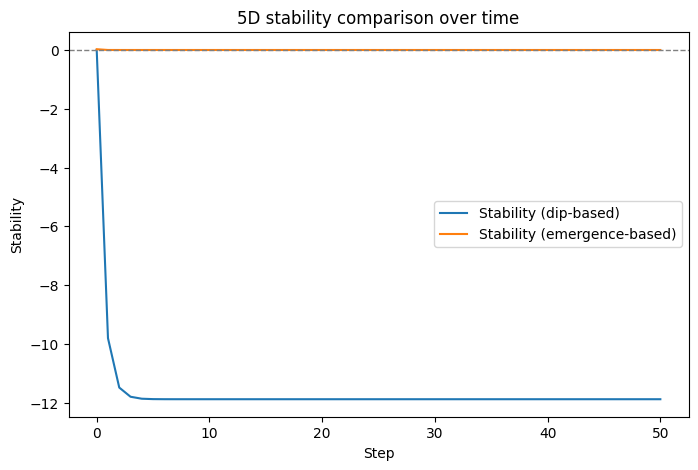

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from numpy.fft import rfft

df = pd.DataFrame(metrics)

# Dips (5D)
entropy_dip = df['entropy'].iloc[0] - df['entropy'].iloc[-1]
grad_dip    = df['grad_energy'].iloc[0] - df['grad_energy'].iloc[-1]

# Dual stability
stability_dip = 0.5 * (entropy_dip + grad_dip)
# Emergence stability from central 3D slice curvature variance (final step)
stability_emergence = 1.0 / (1.0 + df['slice_curv_var'].iloc[-1])

# Build curvature ring on a central 2D plane within the 3D slice
# Use final Laplacian and take plane z = L//2
lap_final = laplacian_5d(s)
curv3d    = lap_final[:, :, :, L//2, L//2]
curv2d    = curv3d[:, :, L//2]

ring      = sample_ring_2d(curv2d)
ring_c    = ring - ring.mean()
spec      = np.abs(rfft(ring_c))
spec_norm = spec / (spec.max() + 1e-12)
peaks, _  = find_peaks(spec_norm[1:], prominence=0.08)
generation_count = len(peaks)
force_strength   = float(np.sqrt(np.mean(ring_c**2)))
ring_energy      = float(np.sum(ring_c**2))

# Dipole from the field plane
phi3d    = s[:, :, :, L//2, L//2]
phi2d    = phi3d[:, :, L//2]
ent_ring = sample_ring_2d(phi2d)
ent_c    = ent_ring - ent_ring.mean()
ent_spec = np.abs(rfft(ent_c))
dipole_strength = float(ent_spec[1] / (ent_spec.max() + 1e-12))

print("Final emergence metrics (5D):")
print(f"- Entropy dip:            {entropy_dip:.4f}")
print(f"- Gradient dip:           {grad_dip:.4f}")
print(f"- Stability (dip-based):  {stability_dip:.4f}")
print(f"- Stability (emergence):  {stability_emergence:.6f}")
print(f"- Force strength:         {force_strength:.3f}")
print(f"- Ring energy:            {ring_energy:.1f}")
print(f"- Generation count:       {generation_count}")
print(f"- Dipole strength:        {dipole_strength:.3f}")

# Time-series comparison (5D)
dip_series = []
emg_series = []

for k in range(len(df)):
    dip_series.append(
        0.5 * (df['entropy'].iloc[0] - df['entropy'].iloc[k]) +
        0.5 * (df['grad_energy'].iloc[0] - df['grad_energy'].iloc[k])
    )
    emg_series.append(1.0 / (1.0 + df['slice_curv_var'].iloc[k]))

plt.figure(figsize=(8,5))
plt.plot(range(len(df)), dip_series, label='Stability (dip-based)', color='tab:blue')
plt.plot(range(len(df)), emg_series, label='Stability (emergence-based)', color='tab:orange')
plt.axhline(0, color='gray', linewidth=1, linestyle='--')
plt.xlabel('Step'); plt.ylabel('Stability')
plt.title('5D stability comparison over time')
plt.legend(); plt.show()
